# <center> Financial Engineering 2

### *(1) Stochastic Calculus and Brownian Motion*
### *(2) Pricing Options:*
> *a) n-Period Binomial Tree Model* <br>
> *b) Black-Scholes Model*

## <span style='color:blue'> (1) Stochastic Calculus and Brownian Motion </span>

#### 1.1) Brownian Motion and Random Walks:

The increments of the Brownian Motion are Gaussian, i.e. for $u > 0 \implies W_{t + u} - W_{t} \sim N(0, u)$. 

#### $\;\;\;\;\;$ 2D Brownian Motion:

In [1]:
%%capture 

#Imports------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation 
from matplotlib.animation import FuncAnimation, PillowWriter 
from scipy import stats
import cython
import random
import mpl_toolkits.mplot3d.axes3d as p3
from IPython.display import HTML

#Configs------------------------------------------------------------
%autosave 300
%load_ext Cython

In [2]:
np.random.seed(1234)
def brownian_motion(N, T, h):
    """
    Simulates a Brownian motion
    :param int N : the number of discrete steps
    :param int T: the number of continuous time steps
    :param float h: the variance of the increments
    """   
    dt = 1. * T/N  # the normalizing constant
    random_increments = np.random.normal(0.0, 1.0 * h, N)*np.sqrt(dt)  # the epsilon values
    brownian_motion = np.cumsum(random_increments)  # calculate the brownian motion
    brownian_motion = np.insert(brownian_motion, 0, 0.0) # insert the initial condition
    
    return brownian_motion, random_increments

N = 50 # the number of discrete steps
T = 1 # the number of continuous time steps
h = 1 # the variance of the increments
dt = 1.0 * T/N  # total number of time steps

# generate a brownian motion
X, epsilon = brownian_motion(N, T ,h)

In [3]:
%%capture
fig = plt.figure(figsize=(21, 10));
ax = plt.axes(xlim=(0, 1));
line, = ax.step([], [], where='mid', color='#0492C2');

In [4]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.rcParams['animation.embed_limit'] = 2**128
#plt.axhline(y = 0, color = 'red', linestyle = '-')
#fig, ax = plt.subplots();


# formatting options
ax.set_xticks(np.linspace(0,1,11));
ax.set_xlabel('Time', fontsize=30);
ax.set_ylabel('Value', fontsize=30);
ax.tick_params(labelsize=22);
ax.grid(True, which='major', linestyle='--', color='black', alpha=0.6);

# initialization function 
def init():
    line.set_data([], [])
    return line,

# animation function 
def animate(i):
    np.random.seed(42)
    y, epsilon = brownian_motion((i + 1) * 10, 1 ,1)
    tr = np.linspace(0.0, 1, (i + 1) * 10 + 1)
    ax.set_title('2D Brownian Motion for {} steps'.format((i + 1) * 10), fontsize=40)
    ax.set_ylim((np.min(y) - 0.1, np.max(y) + 0.1))
    line.set_data(list(tr), list(y)) 
    return line,

# call the animator 
anim1 = FuncAnimation(fig, animate, init_func=init, frames=80, interval=150, blit=True)
anim1

#### $\;\;\;\;\;$ Comparing Forms of Brownian Motion:

In [38]:
def brownian_motion(N, T, h, seed=42):
    """Simulates a Brownian motion.
    
    :param int N : number of discrete steps
    :param int T: number of continuous time steps
    :param float h: variance of the increments
    :param int seed: initial seed of the random generator
    :returns tuplpe: the brownian motion and its increments
    """
    # set the seed
    np.random.seed(seed)
    # the normalizing constant
    dt = 1. * T/N
    # the epsilon values
    random_increments = np.random.normal(0.0, 1.0 * h, N)*np.sqrt(dt)
    # calculate the brownian motion
    brownian_motion = np.cumsum(random_increments)
    # insert the initial condition
    brownian_motion = np.insert(brownian_motion, 0, 0.0)
    
    return brownian_motion, random_increments

#------------------------------------------------------------------------------

def drifted_brownian_motion(mu, sigma, N, T, seed=42):
    """Simulates a Brownian Motion with drift.
    
    :param float mu: drift coefficient
    :param float sigma: volatility coefficient
    :param int N : number of discrete steps
    :param int T: number of continuous time steps
    :param int seed: initial seed of the random generator
    :returns list: drifted Brownian motion
    """
    # set the seed
    np.random.seed(seed)
    # standard brownian motion
    W, _ = brownian_motion(N, T ,1.0)
    # the normalizing constant
    dt = 1. * T/N
    # generate the time steps
    time_steps = np.linspace(0.0, N*dt, N+1)
    # calculate the Brownian Motion with drift
    X = mu * time_steps + sigma * W
    return X

#------------------------------------------------------------------------------

In [39]:
#Simulate drifted Brownian Motion without volatility--------------------------------------------------
seed = 42 # the seed to use
mu = 1.45 # the drift
sigma = 1.0 # the diffusial

N = 10000 # number of discret points
T = 10 # number of time units
dt = 1.0 * T/N  # total number of time steps

W, _ = brownian_motion(N, T, 1.0, seed)  # standard Brownian Motion
min_W = np.min(W)  # min of W

X = drifted_brownian_motion(mu, sigma, N, T, seed)  # drifted version
max_X = np.max(X)  # max of X

t = np.linspace(0.0, N*dt, N+1)

#Simulate volatile Brownian Motion without drift-------------------------------------------------------
seed_v = 42 # the seed to use
mu_v = 0.0 # the drift
sigma_v = 2.25 # the diffusial

Nv = 10000 # number of discret points
Tv = 10 # number of time units
dt_v = 1.0 * Tv/Nv  # total number of time steps

Wv, _ = brownian_motion(Nv, Tv, 1.0, seed_v)  # standard Brownian Motion
min_Wv, max_Wv = np.min(Wv), np.max(Wv)  # min and max of W

Xv = drifted_brownian_motion(mu_v, sigma_v, Nv, Tv, seed_v)  # drifted version
min_Xv, max_Xv, = np.min(Xv), np.max(Xv)  # min and max of X

t_v = np.linspace(0.0, Nv*dt_v, Nv+1)

#Combined-----------------------------------------------------------------------------------------------
seed_a = 42 # the seed to use
mu_a = 1.45 # the drift
sigma_a = 2.25 # the diffusial

Na = 10000 # number of discret points
Ta = 10 # number of time units
dt_a = 1.0 * Ta/Na  # total number of time steps


Xa = drifted_brownian_motion(mu_a, sigma_a, Na, Ta, seed_a)  # drift and volatility
t_a = np.linspace(0.0, Na*dt_a, Na+1)

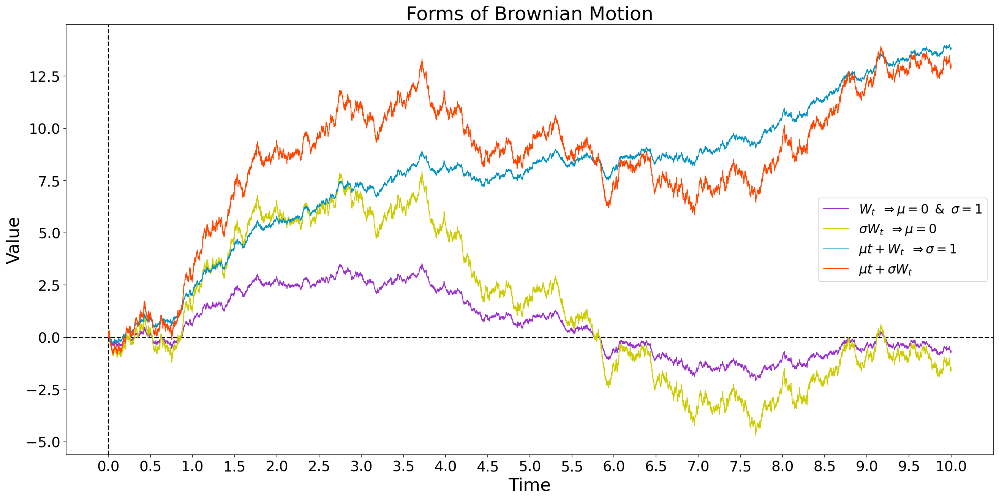

In [64]:
# plot the two brownian motions
plt.figure(figsize=(21, 10))
plt.title('Forms of Brownian Motion', fontsize=24)
plt.xlabel('Time', fontsize=22)
plt.ylabel('Value', fontsize=22)
plt.xticks(np.linspace(0, Ta, 2*Ta + 1), fontsize=18)
plt.yticks(fontsize=18)
plt.axhline(y = 0, color = 'black', linestyle = '--')
plt.axvline(x = 0, color = 'black', linestyle = '--')

#plt.grid(True, which='major', linestyle='--', color='black', alpha=0.8)
plt.step(t_a, W, where='mid', lw=1, color='#9932cc' , label='$W_{t}\\,\\ \\Rightarrow \\mu=0\\,\\ &\\,\\ \\sigma=1$')
plt.step(t_a, Xv, where='mid', lw=1, color='#CCCC00', label='$\\sigma W_{t}\\,\\ \\Rightarrow \\mu=0$')
plt.step(t_a, X, where='mid', lw=1, color='#0492c2', label='$\\mu t + W_{t}\\,\\ \\Rightarrow \\sigma=1$')
plt.step(t_a, Xa, where='mid', lw=1, color='#ff4500', label='$\\mu t + \\sigma W_{t}$')

plt.legend(loc=7, fontsize=16, fancybox=True)
plt.savefig('vol_bm_with_drift.png', dpi=300, bbox_inches='tight')